In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import erf
from scipy.optimize import fsolve

In [2]:
T_left = -10
Tm = 0
alpha = 1.0
Lh = 1.0
c = 1.0
rho = 1.0

In [3]:
def stefan_eq(lambda_):
    return lambda_ * np.exp(-lambda_**2) / erf(lambda_) - (Lh / (c * (Tm - T_left))) * np.sqrt(np.pi * alpha)

In [4]:
lambda_sol = fsolve(stefan_eq, 0.5)[0]

In [5]:
def s(t):
    return 2 * lambda_sol * np.sqrt(alpha * t)

def T(x, t):
    if t == 0:
        return Tm
    return T_left * erf(x / (2 * np.sqrt(alpha * t))) / erf(lambda_sol)

In [6]:
ts = [0.01, 0.05, 0.1]
x = np.linspace(0, 1, 200)

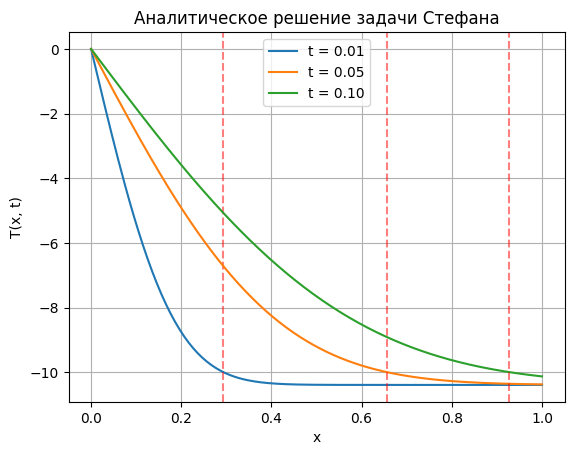

In [9]:
for t in ts:
    T_vals = [T(xi, t) for xi in x]
    plt.plot(x, T_vals, label=f"t = {t:.2f}")
    plt.axvline(s(t), color='r', linestyle='--', alpha=0.5)
    
plt.title("Аналитическое решение задачи Стефана")
plt.xlabel("x")
plt.ylabel("T(x, t)")
plt.legend()
plt.grid()
plt.show()

In [11]:
L = 1.0
Nx = 200
dx = L / Nx
dt = 0.001
Nt = 300

Tm = 0.0
T_left = -10.0
T_right = 10.0

a1 = 1.0
a2 = 0.5
k1 = 1.0
k2 = 0.5
rho = 1.0
Lh = 1.0
chi = rho * Lh

x = np.linspace(0, L, Nx)
U = np.ones(Nx) * T_right

s0 = 0.5 * L
s_index = int(s0 / dx)
U[:s_index] = T_left
U[s_index] = Tm

fronts = [s0]
U_history = [U.copy()]

In [12]:
def thomas_algorithm(a, b, c, d):
    n = len(d)
    c_ = np.zeros(n-1)
    d_ = np.zeros(n)

    c_[0] = c[0] / b[0]
    d_[0] = d[0] / b[0]
    for i in range(1, n-1):
        denom = b[i] - a[i-1] * c_[i-1]
        c_[i] = c[i] / denom
        d_[i] = (d[i] - a[i-1] * d_[i-1]) / denom
    d_[-1] = (d[-1] - a[-2] * d_[-2]) / (b[-1] - a[-2] * c_[-2])

    x = np.zeros(n)
    x[-1] = d_[-1]
    for i in range(n-2, -1, -1):
        x[i] = d_[i] - c_[i] * x[i+1]
    return x


In [13]:
for n in range(Nt):
    U_new = U.copy()

    # Расчёт в области льда (до s_index)
    if s_index > 2:
        N1 = s_index
        a = np.ones(N1-1) * (-a1**2 / dx**2)
        b = np.ones(N1) * (1/dt + 2 * a1**2 / dx**2)
        c = np.ones(N1-1) * (-a1**2 / dx**2)
        d = U[:N1] / dt
        d[0] += a1**2 * T_left / dx**2
        U_new[:N1] = thomas_algorithm(a, b, c, d)

    # Расчёт в области воды (после s_index)
    if s_index < Nx - 3:
        N2 = Nx - (s_index + 1)
        a = np.ones(N2-1) * (-a2**2 / dx**2)
        b = np.ones(N2) * (1/dt + 2 * a2**2 / dx**2)
        c = np.ones(N2-1) * (-a2**2 / dx**2)
        d = U[s_index+1:] / dt
        d[-1] += a2**2 * T_right / dx**2
        U_new[s_index+1:] = thomas_algorithm(a, b, c, d)

    # на фронте температура плавления
    U_new[s_index] = Tm

    # Условие Стефана — расчёт скорости фронта
    if 2 <= s_index < Nx - 3:
        dU1_dx = (U_new[s_index] - U_new[s_index - 1]) / dx
        dU2_dx = (U_new[s_index + 1] - U_new[s_index]) / dx
        ds_dt = (k1 * dU1_dx - k2 * dU2_dx) / chi
    else:
        ds_dt = 0.0

    # Обновление позиции фронта
    s_pos = fronts[-1] + ds_dt * dt
    s_pos = np.clip(s_pos, dx, L - dx)
    s_index = int(s_pos / dx)
    fronts.append(s_pos)

    # Обновление температуры
    U = U_new.copy()
    U_history.append(U.copy())


D:\Users\Boris\PycharmProjects\pythonProject3\.venv\Lib\site-packages\matplotlib\animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


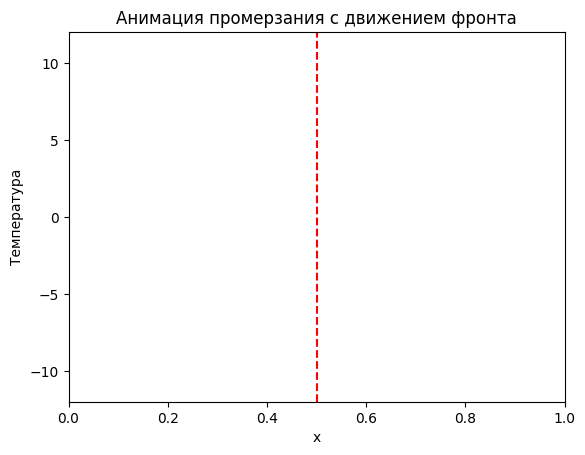

In [16]:
import matplotlib.animation as animation

fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)
front_line = ax.axvline(x=fronts[0], color='r', linestyle='--')
ax.set_xlim(0, L)
ax.set_ylim(-12, 12)
ax.set_xlabel("x")
ax.set_ylabel("Температура")
ax.set_title("Анимация промерзания с движением фронта")

def init():
    line.set_data([], [])
    front_line.set_xdata([fronts[0], fronts[0]])
    return line, front_line

def animate(i):
    line.set_data(x, U_history[i])
    front_line.set_xdata([fronts[i], fronts[i]])
    return line, front_line

ani = animation.FuncAnimation(fig, animate, frames=Nt, init_func=init, interval=40, blit=False)

plt.show()

from IPython.display import HTML
HTML(ani.to_jshtml())
